In [24]:
library(limma)
library(preprocessCore)
library(affy)
library(sva)
source("plotEset.R")
source("diffExpress.R")
source("data_wrangle_misc.R")

### Read in data matrix. Use column name to figure out experimental condition

In [25]:
# read the expression matrix
eset <- read.delim2(file="input/counts2.txt")

# create df for experimental condition
phenoData <- data.frame(ID = colnames(eset[2:ncol(eset)]))
phenoData$treatment <- sapply(phenoData$ID, function(x) strsplit(x, split=".", fixed=T)[[1]][1])
phenoData$drug <- sapply( phenoData$treatment, function(x) gsub("[0-9]","", x))
phenoData$dose <- sapply( phenoData$treatment, function(x) as.numeric(gsub("[A-Z]","", x, ignore.case=T)))
phenoData$dose[is.na(phenoData$dose)] <- 0
phenoData$treatment <- NULL
phenoData$time <- sapply(phenoData$ID, function(x) as.numeric(strsplit(strsplit(x, split=".", fixed=T)[[1]][2], split="_", fixed=T)[[1]][1]))
phenoData$rep <- sapply(phenoData$ID, function(x) strsplit(strsplit(x, split=".", fixed=T)[[1]][2], split="_", fixed=T)[[1]][2])
rownames(phenoData) <- phenoData$ID

### Convert data to long format, transform the raw count by IHS, plotting distribution

In [26]:
# reshape eset into long data frame
eset.l <- reshape2::melt(eset, id.vars="Gene", variable.name="ID", value.name="count")
eset.l$ihs <- log(eset.l$count + sqrt(eset.l$count^2 + 1))
eset.l %<>% plyr::join(., phenoData, by="ID")

### Plot the drugs together, then individually

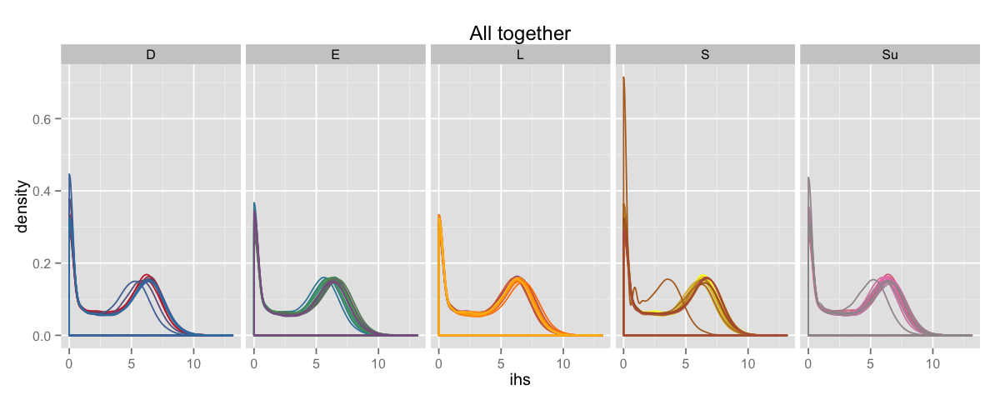

In [27]:
options(repr.plot.height = 4, repr.plot.width = 10.)
colourCount = length(unique(eset.l$ID))
getPalette = colorRampPalette(brewer.pal(9, "Set1"))
p <- ggplot(eset.l, aes(ihs, color=ID)) + geom_density(alpha=0.5) + facet_grid(.~drug) 
p <- p + scale_color_manual(values = getPalette(colourCount))
p <- p + ggtitle("All together") + theme(legend.position="none")
p

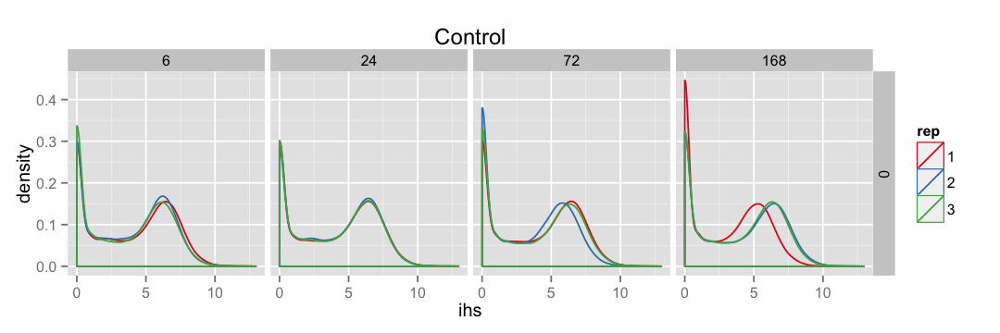

In [28]:
options(repr.plot.height = 3, repr.plot.width = 9.)
p <- ggplot(data=subset(eset.l, drug=="D"), aes(ihs, color=rep)) + geom_density(alpha=0.5) + facet_grid(dose~time) + scale_color_brewer(palette="Set1")
p <- p + ggtitle("Control")
p

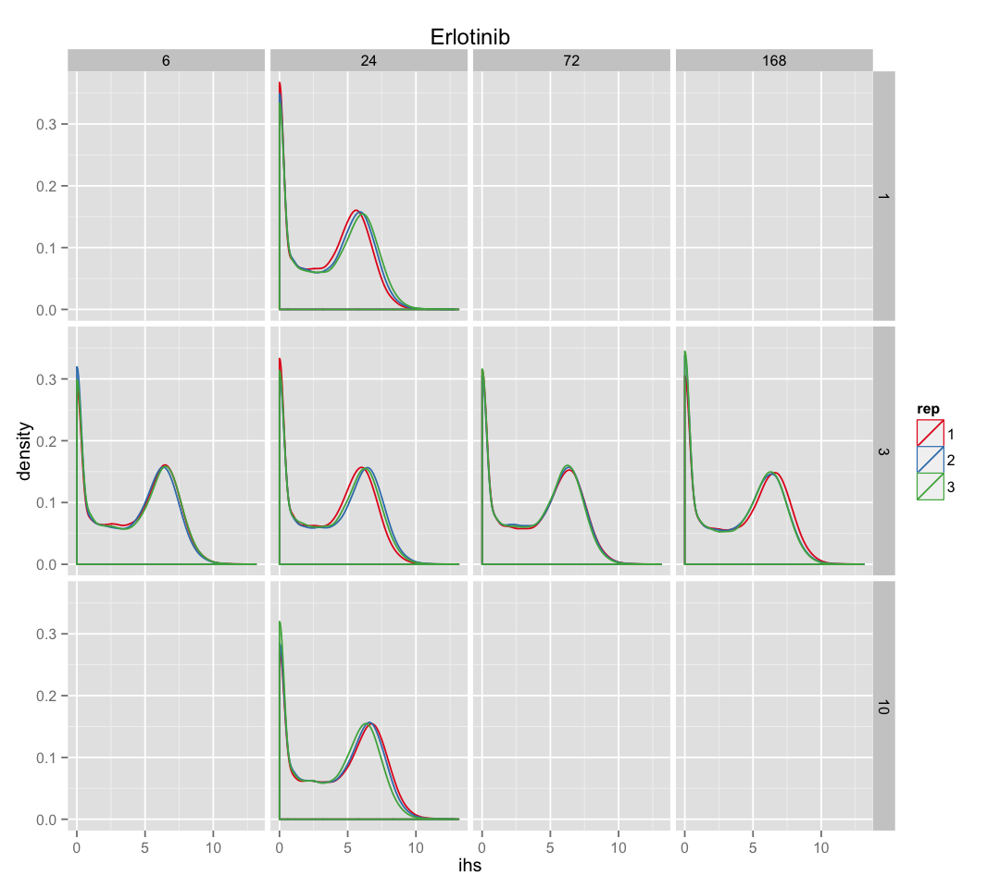

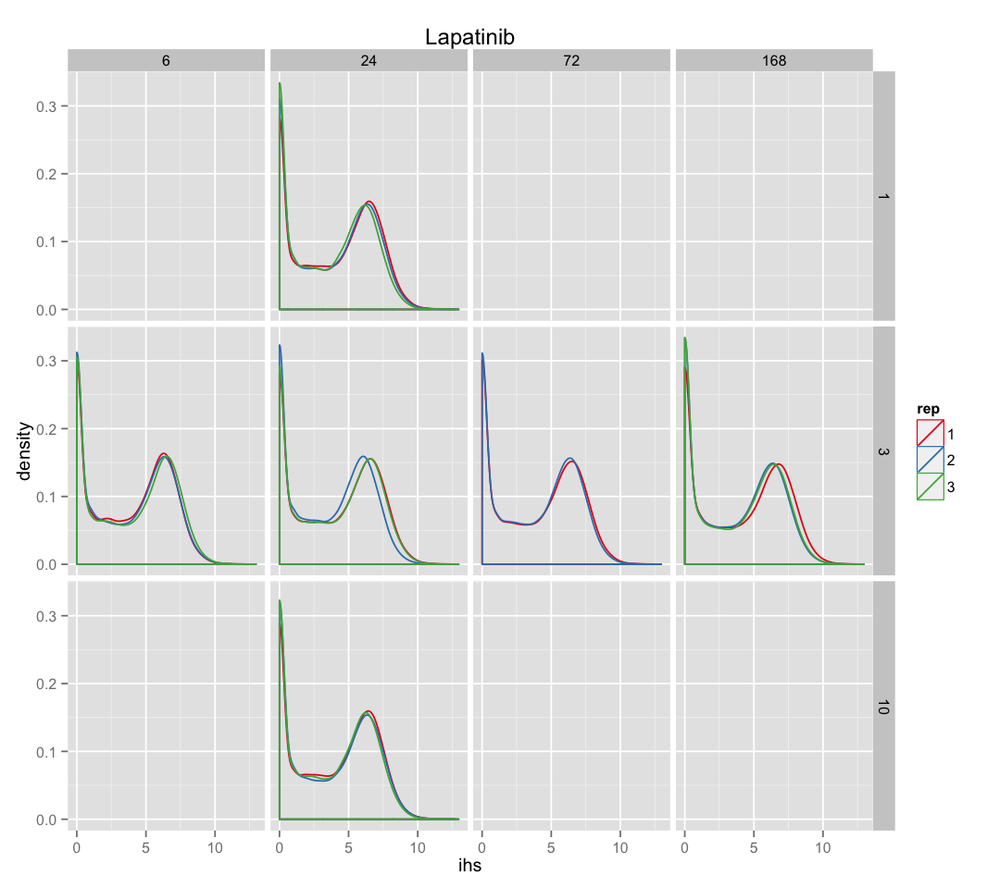

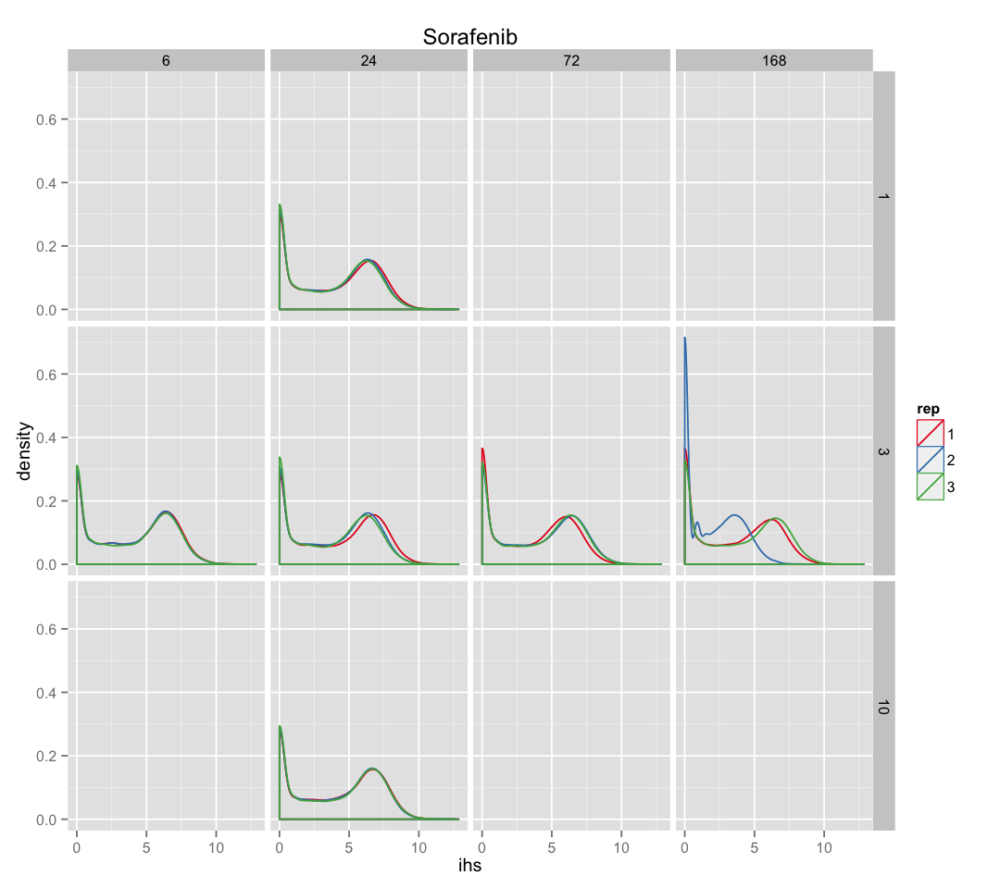

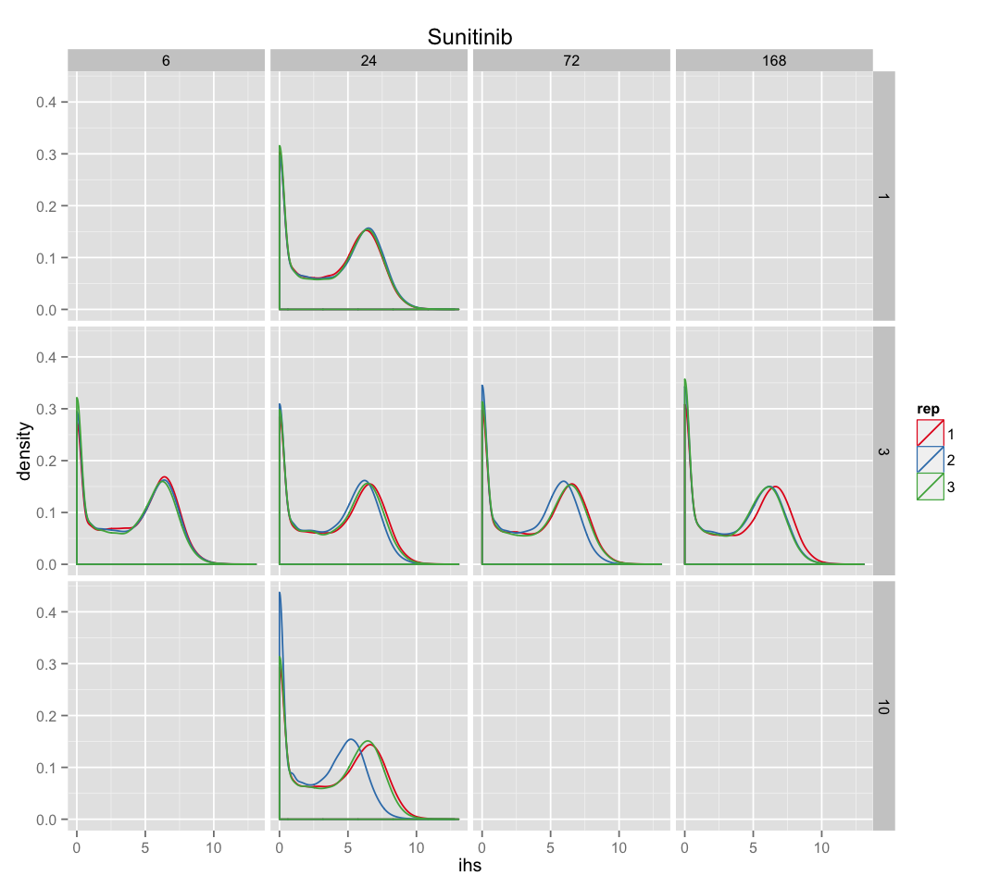

In [29]:
options(repr.plot.height = 8, repr.plot.width = 9.)
p <- ggplot(data=subset(eset.l, drug=="E"), aes(ihs, color=rep)) + geom_density(alpha=0.5) + facet_grid(dose~time) + scale_color_brewer(palette="Set1")
p <- p + ggtitle("Erlotinib")
p
p <- ggplot(data=subset(eset.l, drug=="L"), aes(ihs, color=rep)) + geom_density(alpha=0.5) + facet_grid(dose~time) + scale_color_brewer(palette="Set1")
p <- p + ggtitle("Lapatinib")
p
p <- ggplot(data=subset(eset.l, drug=="S"), aes(ihs, color=rep)) + geom_density(alpha=0.5) + facet_grid(dose~time) + scale_color_brewer(palette="Set1")
p <- p + ggtitle("Sorafenib")
p
p <- ggplot(data=subset(eset.l, drug=="Su"), aes(ihs, color=rep)) + geom_density(alpha=0.5) + facet_grid(dose~time) + scale_color_brewer(palette="Set1")
p <- p + ggtitle("Sunitinib")
p

### Remove 3 conditions, remove low expression genes, do quantile normalization

In [30]:
# remove a few conditions
eset.l <- subset(eset.l, !ID %in% c("D.168_1", "S3.168_2", "Su10.24_2") )

# tally for each gene how many conditions are nonzero
treat_pm <- group_by(eset.l, Gene, drug) %>% dplyr::summarise(., N_present = sum(ihs>0))
missing_genes <- treat_pm %>% as.data.frame %>% arrange(., Gene, -N_present) %>% subset(., !duplicated(Gene)) %>% subset(., N_present < 5)
# remove missing genes from eset
eset.l %<>% subset(., ! Gene %in% missing_genes$Gene)

# quantile normalize
eset <- df2Eset(eset.l, phenoData)
eset.n <- qnEset(eset)

Using ihs as value column: use value.var to override.


### Look at MDS plot with or without quantile normalization

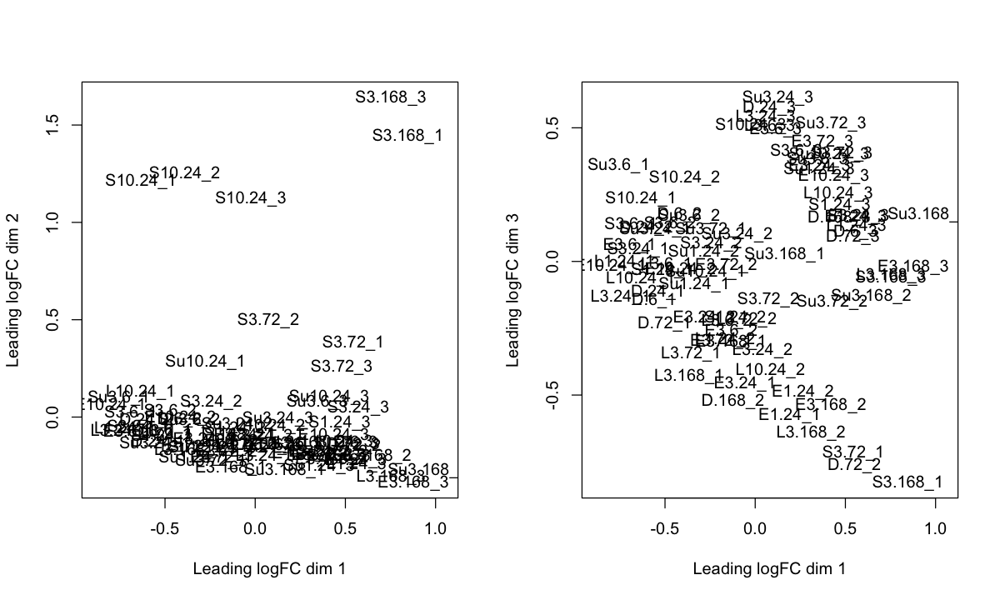

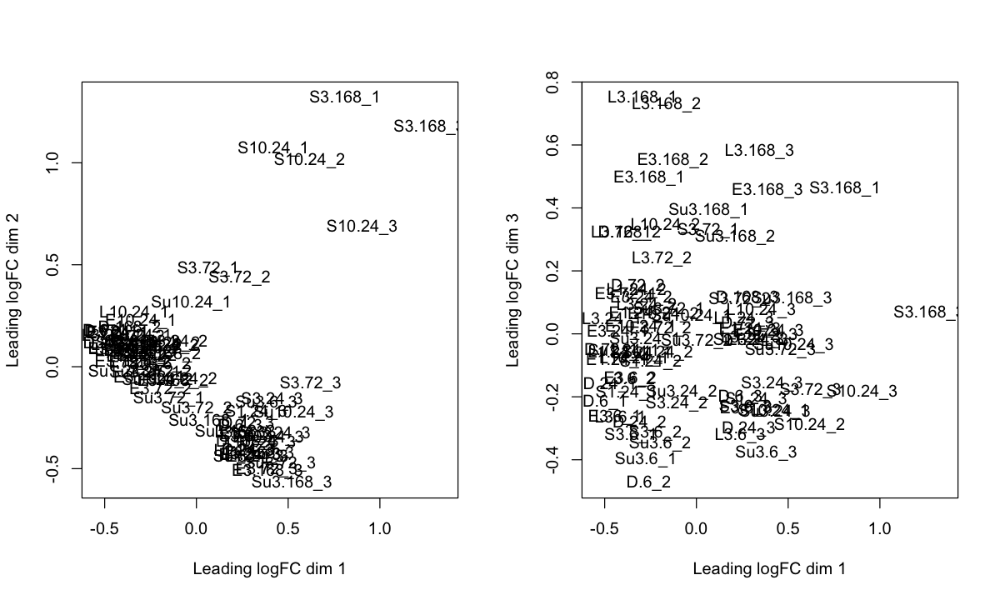

In [36]:
options(reprs.plot.height = 6, repr.plot.width = 10.)
par(mfrow=c(1,2))
plotMDS(eset, dim.plot=c(1,2), ndim=3, top=2000)
plotMDS(eset, dim.plot=c(1,3), ndim=3, top=2000)

plotMDS(eset.n, dim.plot=c(1,2), ndim=3, top=2000)
plotMDS(eset.n, dim.plot=c(1,3), ndim=3, top=2000)


Found 3 batches
Found 0  categorical covariate(s)
Standardizing Data across genes
Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data


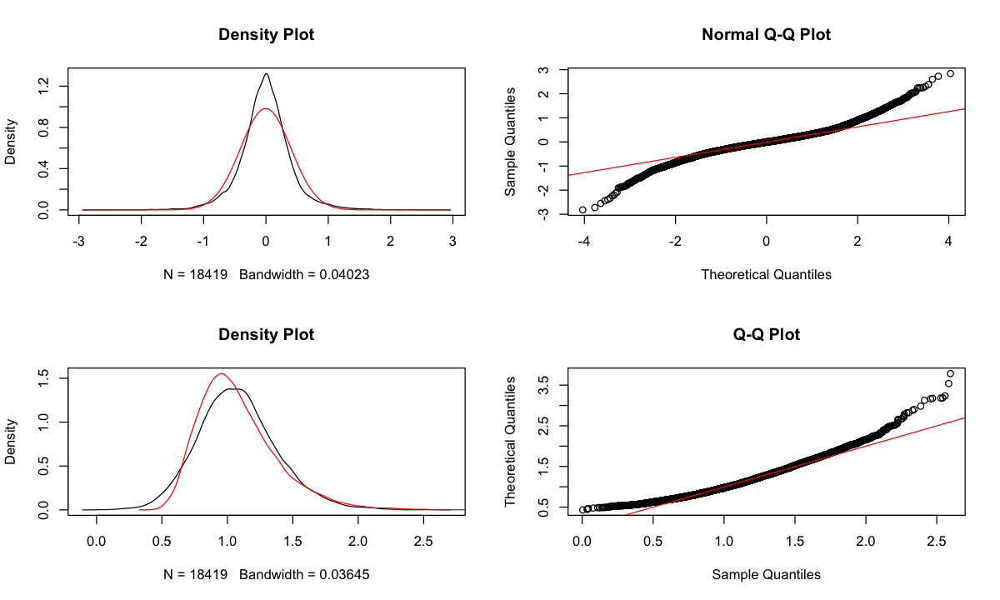

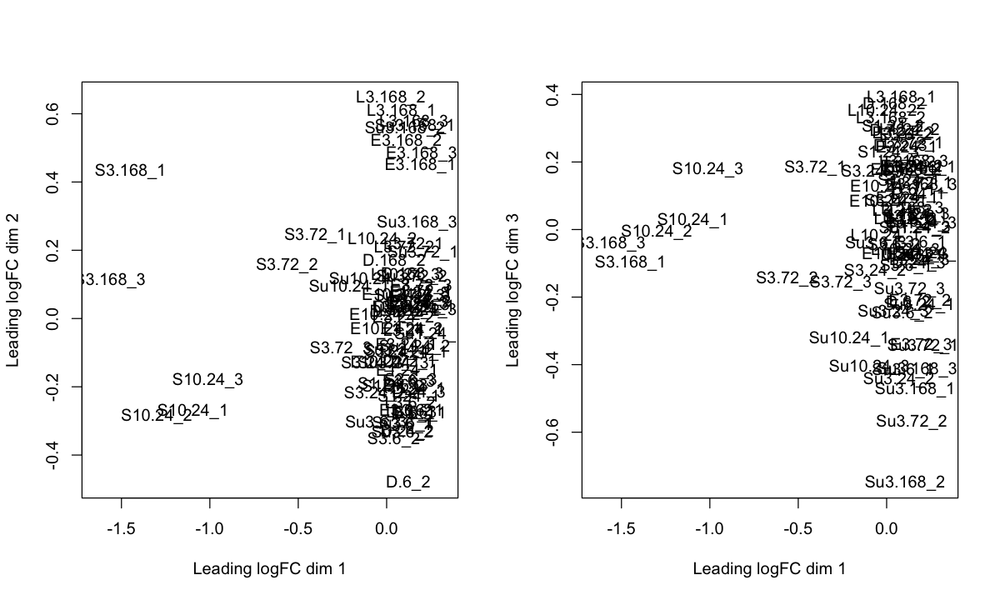

In [37]:
eset.c<-useComBat(eset.n)
options(repr.plot.height = 6, repr.plot.width = 10.)
par(mfrow=c(1,2))
plotMDS(eset.c, dim.plot=c(1,2), ndim=3, top=2000)
plotMDS(eset.c, dim.plot=c(1,3), ndim=3, top=2000)